# Explore here

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage

## Carga y Preparación del Conjunto de Datos

In [2]:
url = "../data/raw/housing.csv"  # Cambia la ruta al archivo CSV según sea necesario
data = pd.read_csv(url)

# Selección de las características relevantes
data_limpia = data[['Latitude', 'Longitude', 'MedInc']].copy() # Usamos .copy() para evitar SettingWithCopyWarning

# División del conjunto de datos en muestras de train y test
X = data_limpia
X_train, X_test = train_test_split(X, test_size=0.2, random_state=42)

print("Primeras filas del conjunto de entrenamiento:")
print(X_train.head())

Primeras filas del conjunto de entrenamiento:
       Latitude  Longitude  MedInc
14196     32.71    -117.03  3.2596
8267      33.77    -118.16  3.8125
17445     34.66    -120.48  4.1563
14265     32.69    -117.11  1.9425
2271      36.78    -119.80  3.5542


## Construcción y Visualización del Modelo K-Means


Primeras filas del conjunto de entrenamiento con las etiquetas de cluster:
       Latitude  Longitude  MedInc  Cluster
14196     32.71    -117.03  3.2596        3
8267      33.77    -118.16  3.8125        1
17445     34.66    -120.48  4.1563        1
14265     32.69    -117.11  1.9425        3
2271      36.78    -119.80  3.5542        5


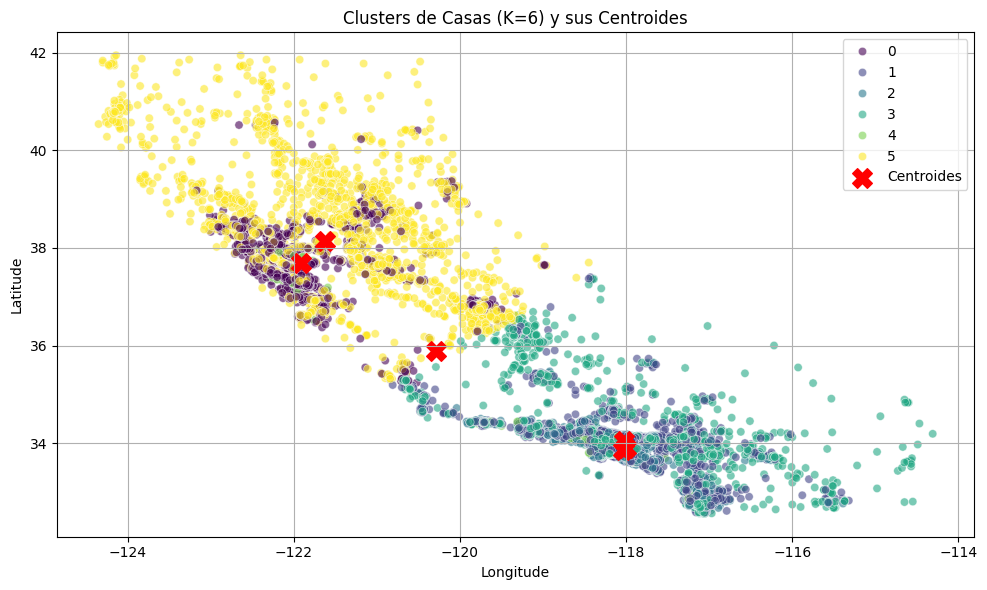

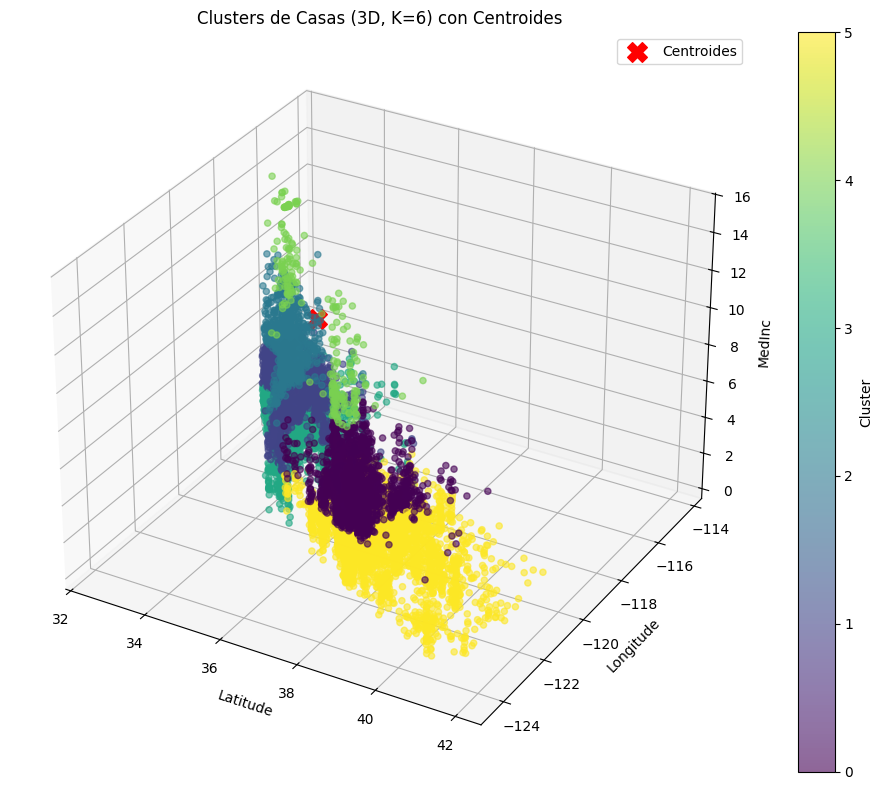

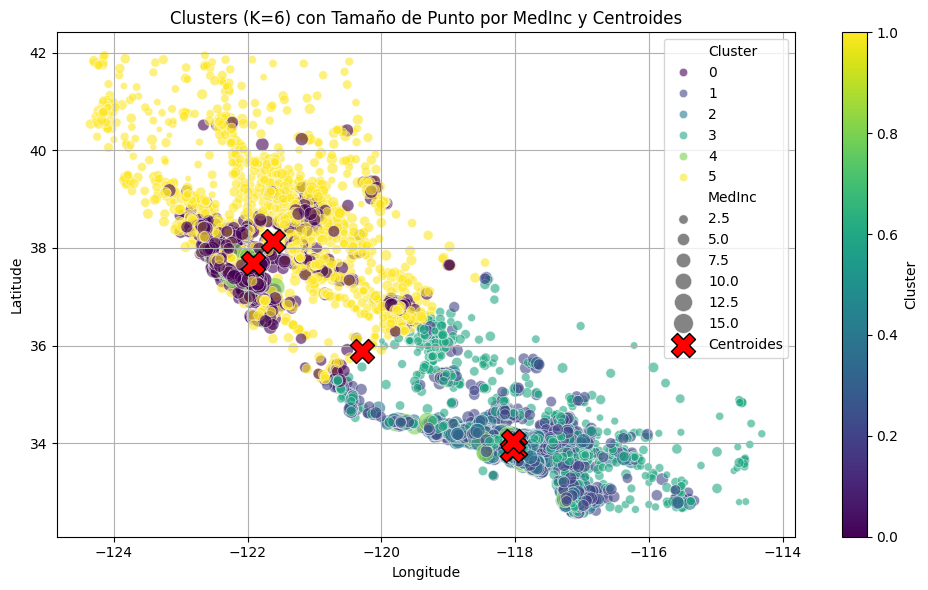

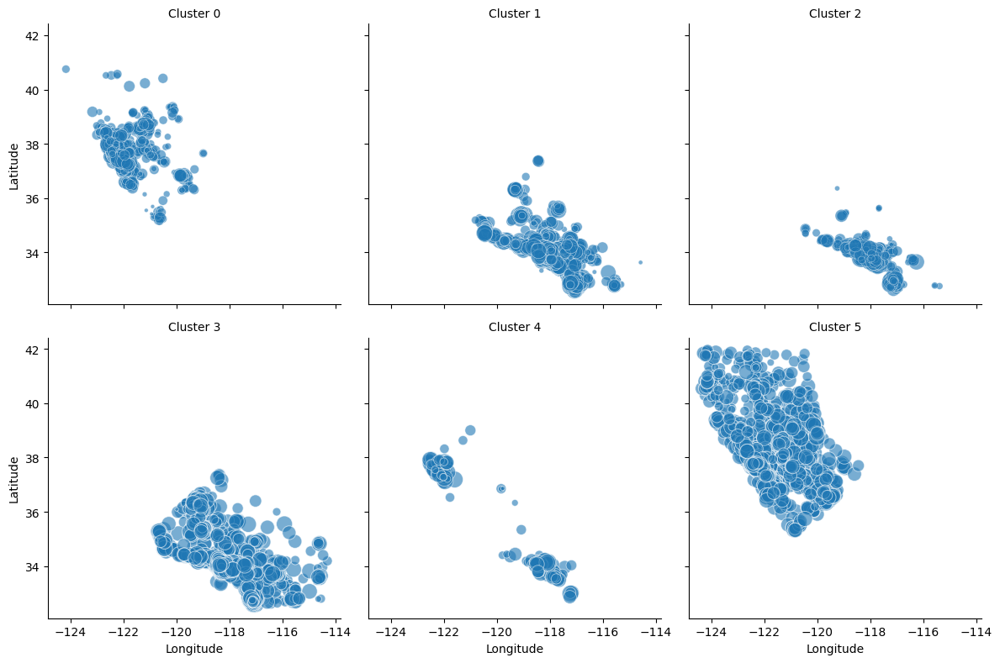

In [3]:
# Entrenar el modelo K-Means
n_clusters = 6
kmeans_model = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto') # Especificamos n_init para evitar futuros warnings
kmeans_model.fit(X_train)

# Asignar las etiquetas de cluster al conjunto de entrenamiento
X_train['Cluster'] = kmeans_model.labels_

print("\nPrimeras filas del conjunto de entrenamiento con las etiquetas de cluster:")
print(X_train.head())

# %%
# Visualización de clusters en 2D (Latitude vs. Longitude) con centroides
plt.figure(figsize=(10, 6))
sns.scatterplot(data=X_train, x='Longitude', y='Latitude', hue='Cluster', palette='viridis', alpha=0.6)
plt.scatter(kmeans_model.cluster_centers_[:, 1], kmeans_model.cluster_centers_[:, 0], c='red', marker='X', s=200, label='Centroides')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title(f'Clusters de Casas (K={n_clusters}) y sus Centroides')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# %%
# Visualización de clusters en 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_train['Latitude'], X_train['Longitude'], X_train['MedInc'], c=X_train['Cluster'], cmap='viridis', alpha=0.6)
ax.scatter(kmeans_model.cluster_centers_[:, 0], kmeans_model.cluster_centers_[:, 1], kmeans_model.cluster_centers_[:, 2],
           c='red', marker='X', s=200, label='Centroides', depthshade=False)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('MedInc')
ax.set_title(f'Clusters de Casas (3D, K={n_clusters}) con Centroides')
fig.colorbar(scatter, label='Cluster')
plt.legend()
plt.tight_layout()
plt.show()

# %%
# Visualización de clusters con tamaño de punto proporcional a MedInc
plt.figure(figsize=(10, 6))
sns.scatterplot(data=X_train, x='Longitude', y='Latitude', hue='Cluster', size='MedInc', sizes=(20, 200), palette='viridis', alpha=0.6)
plt.scatter(kmeans_model.cluster_centers_[:, 1], kmeans_model.cluster_centers_[:, 0], c='red', marker='X', s=300, edgecolors='black', label='Centroides', zorder=10)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title(f'Clusters (K={n_clusters}) con Tamaño de Punto por MedInc y Centroides')
plt.colorbar(label='Cluster')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# %%
# FacetGrid para visualizar la distribución de los clusters en diferentes pares de variables
grid = sns.FacetGrid(X_train, col="Cluster", col_wrap=3, height=4)
grid.map_dataframe(sns.scatterplot, x="Longitude", y="Latitude", size="MedInc", sizes=(10, 200), alpha=0.6)
grid.set_axis_labels("Longitude", "Latitude")
grid.set_titles("Cluster {col_name}")
plt.tight_layout()
plt.show()

## Guardar modelo con K-MEANS

In [4]:
import joblib
import os

kmeans_model_path = "../models/kmeans_model.joblib"
os.makedirs(os.path.dirname(kmeans_model_path), exist_ok=True)

joblib.dump(kmeans_model, kmeans_model_path)
print(f"\nModelo K-Means guardado en: {kmeans_model_path}")


Modelo K-Means guardado en: ../models/kmeans_model.joblib


## Predicción con el Conjunto de Prueba


Primeras filas del conjunto de prueba con las etiquetas de cluster predichas:
       Latitude  Longitude  MedInc  Cluster
20046     36.06    -119.01  1.6812        3
3024      35.14    -119.46  2.5313        3
15663     37.80    -122.44  3.4801        5
20484     34.28    -118.72  5.7376        2
9814      36.62    -121.93  3.7250        5


/var/folders/jl/x5zpkzkd5m313zdg9lyh1f4h0000gn/T/ipykernel_31483/2534216234.py:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


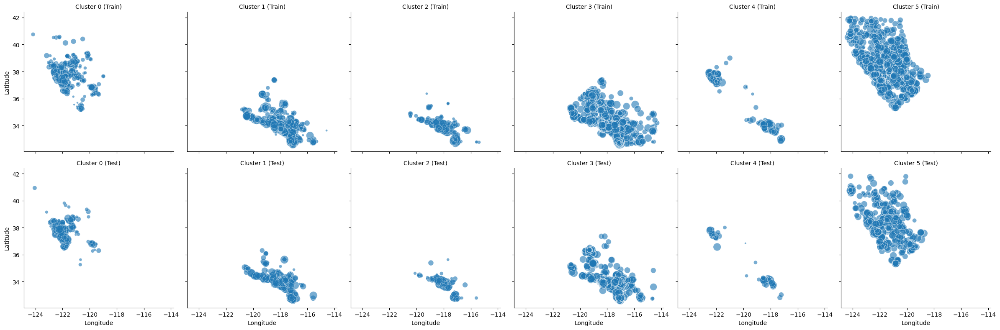

In [5]:
predictions = kmeans_model.predict(X_test)

# Asignar las etiquetas de cluster predichas al conjunto de prueba
X_test['Cluster'] = predictions

print("\nPrimeras filas del conjunto de prueba con las etiquetas de cluster predichas:")
print(X_test.head())

# %%
# Visualización de los clusters de entrenamiento y las predicciones del conjunto de prueba
plt.figure(figsize=(10, 6))
sns.scatterplot(data=X_train, x='Longitude', y='Latitude', hue='Cluster', size='MedInc', sizes=(20, 200), palette='viridis', alpha=0.6, legend='full')
sns.scatterplot(data=X_test, x='Longitude', y='Latitude', hue='Cluster', size='MedInc', sizes=(20, 200), palette='viridis', alpha=0.6, edgecolor='black', marker='o', label='Predicciones Test', legend=False)
plt.scatter(kmeans_model.cluster_centers_[:, 1], kmeans_model.cluster_centers_[:, 0], c='red', marker='X', s=300, edgecolors='black', label='Centroides', zorder=10)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title(f'Clusters de Entrenamiento y Predicciones del Test (K={n_clusters})')
plt.colorbar(label='Cluster')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# %%
# Visualización separada de los clusters para entrenamiento y prueba usando FacetGrid
X_train_copy = X_train.copy()
X_train_copy['Dataset'] = 'Train'
X_test_copy = X_test.copy()
X_test_copy['Dataset'] = 'Test'
combined_df = pd.concat([X_train_copy, X_test_copy])

grid_combined = sns.FacetGrid(combined_df, col="Cluster", row="Dataset", height=4)
grid_combined.map_dataframe(sns.scatterplot, x="Longitude", y="Latitude", size="MedInc", sizes=(10, 200), alpha=0.6)
grid_combined.set_axis_labels("Longitude", "Latitude")
grid_combined.set_titles("Cluster {col_name} ({row_name})")
plt.tight_layout()
plt.show()

## Análisis Jerárquico (Dendrograma)

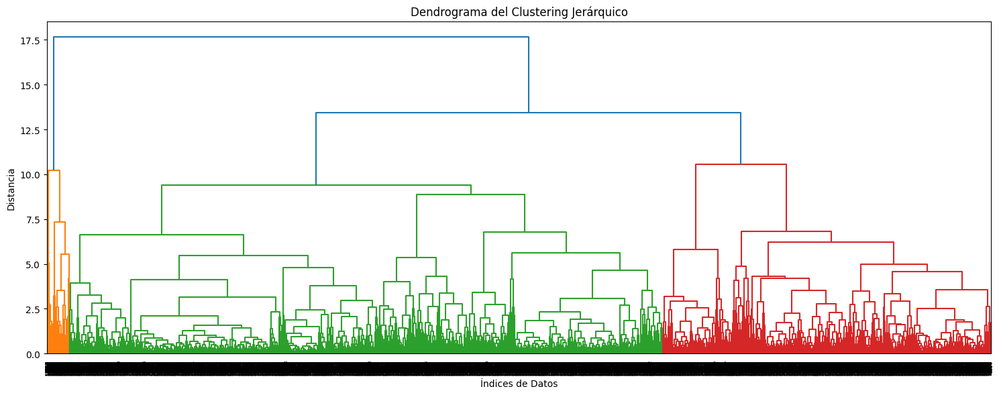

In [6]:
Z = linkage(X_train[['Latitude', 'Longitude', 'MedInc']], method="complete")

# Mostrar el dendrograma
plt.figure(figsize=(15, 6))
dendrogram(Z)
plt.title("Dendrograma del Clustering Jerárquico")
plt.xlabel("Índices de Datos")
plt.ylabel("Distancia")
plt.tight_layout()
plt.show()

## Entrenamiento y Evaluación de un Modelo de Clasificación Supervisada (KNN)

In [7]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Preparar las etiquetas (clusters asignados por K-Means) para el entrenamiento del KNN
y_train = X_train['Cluster']
y_test = X_test['Cluster']
X_train_features = X_train[['Latitude', 'Longitude', 'MedInc']]
X_test_features = X_test[['Latitude', 'Longitude', 'MedInc']]

# Inicializar y entrenar el modelo KNN
knn_model = KNeighborsClassifier()
knn_model.fit(X_train_features, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred_knn = knn_model.predict(X_test_features)

# Evaluar la precisión del modelo KNN
accuracy = accuracy_score(y_test, y_pred_knn)
print(f"\nPrecisión del modelo KNN en el conjunto de prueba: {accuracy:.4f}")


Precisión del modelo KNN en el conjunto de prueba: 0.9920


## Guardar modelo con KNN

In [8]:
knn_model_path = "../models/knn_model.joblib"
os.makedirs(os.path.dirname(knn_model_path), exist_ok=True)
joblib.dump(knn_model, knn_model_path)
print(f"Modelo KNN guardado en: {knn_model_path}")


Modelo KNN guardado en: ../models/knn_model.joblib
